<a href="https://colab.research.google.com/github/project-ida/classical-analogs/blob/master/01-harmonic-oscillators.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<a href="https://nbviewer.org/github/project-ida/classical-analogs/blob/master/01-harmonic-oscillators.ipynb" target="_parent"><img src="https://nbviewer.org/static/img/nav_logo.svg" alt="Open In nbviewer" width="100"/></a>

<a href="https://nbviewer.jupyter.org/github/project-ida/classical-analogs/blob/master/01-harmonic-oscillators.ipynb" target="_parent"><img src="https://nbviewer.jupyter.org/static/img/nav_logo.svg" alt="Open In nbviewer" width="100"/></a>

# Harmonic oscillators and coupled harmonic oscillators 

In this tutorial we will talk about various kinds of harmonic oscillators.

## 1. Python helper functions

In [58]:
# loading some common python libraries

import numpy as np
from numpy import linalg
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import Image
from IPython.core.display import HTML 
import sympy as sp
#from google.colab.output._publish import javascript
mathjaxurl = "https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.3/latest.js?config=default"
sp.init_printing(use_latex='mathjax') 
import matplotlib.patches as patches
import pandas as pd

In [59]:
def create_fig1(): # create 1 empty subplots with 3 empty lines in each 
    global lines1A
    
    fig1 = plt.figure() #figsize=(8,2)

    ax1A = fig1.add_subplot(111, xlim=(-5, 5), ylim=(-3, 3))
    ax1A.grid(color='lightgrey',alpha=1)
    ax1A.set_xticks(np.arange(-5,5,1))
    ax1A.set_aspect('equal', 'box')    
    
    lines1A = []
    for i in np.arange(0,5,1):
        lobj = ax1A.plot([], [], 'o-')[0] # , lw=0, color='green'
        lines1A.append(lobj)

    plt.close() 
    return fig1

In [60]:
def create_fig2(ymax=50): # create 2 empty subplots with 3 empty lines in each 
    global lines2A,lines2B
    
    fig2 = plt.figure(figsize=(12,8))

    ax2A = fig2.add_subplot(211, xlim=(-5, 5), ylim=(-3, 3))
    ax2A.grid(color='lightgrey',alpha=1)
    #ax2A.axis('equal')
    #ax2A.tick_params(which = 'both', direction = 'out')
    ax2A.set_xticks(np.arange(-5,5,1))
    ax2A.set_aspect('equal', 'box')

    lines2A = []
    for i in np.arange(0,3,1):
        lobj = ax2A.plot([], [], 'o-')[0]
        lines2A.append(lobj)

    ax2B = fig2.add_subplot(212, xlim=(0, ymax), ylim=(-1.2,1.2))

    lines2B = []
    for i in np.arange(0,3,1):
        lobj = ax2B.plot([], [], '-')[0]
        lines2B.append(lobj)
    
    plt.close() 
    return fig2

In [61]:
def animate1(i,data_graph1): # animation function that is called once for every frame (for fig 1)
    global lines1A
    
    for lineno,_ in enumerate(data_graph1): # strep through the list and the data for each line and assign data for frame i
        
        lines1A[lineno].set_xdata(data_graph1[lineno][i][0]) 
        lines1A[lineno].set_ydata(data_graph1[lineno][i][1])

In [62]:
def animate2(i,data_graph1,data_graph2): # animation function that is called once for every frame (for fig 2)
    
    for lineno,value in enumerate(data_graph1):
        lines2A[lineno].set_xdata(data_graph1[lineno][i][0]) 
        lines2A[lineno].set_ydata(data_graph1[lineno][i][1])       

    for lineno,value in enumerate(data_graph2):
        lines2B[lineno].set_xdata(data_graph2[lineno][i][0]) 
        lines2B[lineno].set_ydata(data_graph2[lineno][i][1]) 

In [63]:
def add_massspring_patches(thisfigure):
    
    thisaxis = thisfigure.axes[0]
    
    thisaxis.add_patch(patches.Rectangle(xy=(-5,-3),width=1,height=6,facecolor="gainsboro"))
    thisaxis.add_patch(patches.Rectangle(xy=(4,-3),width=1,height=6,facecolor="gainsboro"))
    thisaxis.add_patch(patches.Rectangle(xy=(-4,-3),width=8,height=2.8,facecolor="gainsboro"))

In [64]:
def add_pendulum_patches(thisfigure):
    
    thisaxis = thisfigure.axes[0]
    
    thisaxis.add_patch(patches.Rectangle(xy=(-5, 2),width=10,height=1,facecolor="gainsboro"))

In [65]:
def add_polar_coordinates(df):
    if 'x1' in df:
        alltheta1 = df.x1
        df['sin1'] = np.sin(alltheta1)*L1
        df['cos1']  = np.cos(alltheta1)*L1
    if 'x2' in df:
        alltheta2 = df.x2
        df['sin2'] = np.sin(alltheta2)*L2
        df['cos2'] = np.cos(alltheta2)*L2
    if 'x3' in df:
        alltheta3 = df.x3
        df['sin3'] = np.sin(alltheta3)*L3
        df['cos3'] = np.cos(alltheta3)*L3   
    return df

## 2. Introduction to the simple harmonic oscillator

In [66]:
Image(url= "https://upload.wikimedia.org/wikipedia/commons/thumb/2/22/Harmonic_oscillator.svg/200px-Harmonic_oscillator.svg.png", width=200)

The harmonic oscillator is a basic concept in physics that can be extended from its simplest form to address many complex problems (as we will see later). It is also a test case for working with differential equations and common formalisms of quantum mechanics such as the Hamiltonian formalism. 

Let's start with the most basic version of the harmonic oscillator: a mass attached to a string and moving horizontally (therefore not affected by gravity) in an environment that is assumed to have no friction. 

This system is not particularly interesting if the initial condition is $x=0$ i.e. the mass is in a position where the spring is not compressed or expanded. In that case the system will not do anything. However, if the initial condition is different, then the spring will either expand or contract which creates an oscillation between two forces: an acceleration and a reverse acceleration. 

In this notebook we will use the following variables. For simplicity many of them are 1. 

In [67]:
m1 = 1
k1 = 0.5

m2 = 1 # second mass and spring for later
k2 = 0.5

kc = 0.1 # coupling spring for later

c = 0.1 # damping factor for later

In [68]:
t_end = 50 # time for simulations
allt = np.arange(0,t_end,0.1) # time vector size 500

## 2.1. Equations of motion from force balance (Newtonian approach)

The two forces will be of equal magnitude at the extremes (turning points) which leads to the expression: 

$$F = ma = -kx$$
$$m\ddot {x} = -kx$$
This can be rewritten as 
$$m\ddot {x} + kx = 0$$
$$\ddot {x} + \frac{k}{m} x = 0$$
for which a solution exists in the form of
$$x(t)=A\sin(\omega t)$$
$$\dot x(t)=B\cos(\omega t)$$
where $\omega ={\sqrt {\frac {k}{m}}}$ and where $A=x_0$ and $B=\frac{p_0}{m}$ are determined by initial conditions. 

And remember from the waves notebook: This can also be expressed as

$$\operatorname{Re}({e^{i\omega t}})$$

We can plot this solution easily:

In [69]:
omega = np.sqrt(k1/m1)

allx = 1*np.sin(omega*allt)
allv = omega*np.cos(omega*allt)

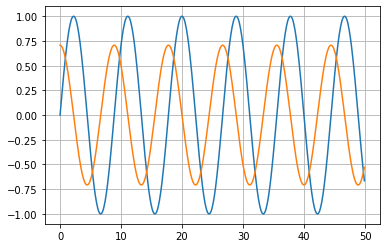

In [70]:
plt.plot(allt,allx)
plt.plot(allt,allv)
plt.grid()

To develop some more intuition about it, and also to introduce the animation process used extensively below, we will now animation this motion:

In [71]:
# create position vectors for the first animated graph
data1 = []
for index,t in enumerate(allt): # step through every time step

    position = allx[index]
    data1.append([[-4,position-1],[0,0]])

In [72]:
# create vector of position function up to respective point for the second animated graph
data2,data3 = ([],[])
for index,t in enumerate(allt): # step through every time step

    position_sofar = allx[:index+1]
    velocity_sofar = allv[:index+1]
    time_sofar = allt[:index+1]
    data2.append([time_sofar,position_sofar]) 
    data3.append([time_sofar,velocity_sofar]) 

In [73]:
# call the animation function 
subplot1_data = [np.asarray(data1)]
subplot2_data = [np.asarray(data2),np.asarray(data3)]

thisfig = create_fig2(20)
add_massspring_patches(thisfig)

ani = animation.FuncAnimation(thisfig,animate2,frames=200,interval=50,fargs=(subplot1_data,subplot2_data))
rc('animation', html='jshtml')
ani

## Intermezzo: Numerical time evolution of coupled differential equations 

In the example above, as is done in many textbooks, we "guessed" the solution functions. In other words, we found them "by inspection." This is not very satisfying because it does not generalize well. In reality, most differential equations are going to be more complicated and no guess can be made easily. So we will introduce here numerical methods that can be applied to a much larger number of systems. 

One of the simplest and oldest numerical technique is known as Euler's method. Like in many numerical approaches, we first need to write a second-order differential equation as a coupled system of first-order differential equations. 

Our equation 
$$\ddot {x} + \frac{k}{m} x = 0$$ 
can also be written as 

$$\ddot x = -\frac{k}{m} x = \dot v = \frac{dv}{dt}$$
$$\dot x = v = \frac{dx}{dt}$$

Basic it means starting from the initial conditions and slowing growing all relevant functions by adding a $\Delta t$ to $x_i$, which turns it into $x_{i+1}$, and using this as an input to calculate other functions that depend on it, e.g. $p_{i+1}(x_{i+1})$

Again, we want to calculate `allx` and `allv` starting from initial conditions `xi = allx[0]` and `vi = allv[0]`:

In [74]:
allx[0] = 1 # initial conditions
allv[0] = 0

dt = 0.1

for j, thist in enumerate(allt):
    if j+1 < len(allt):
        
        dx = allv[j] * dt       
        allx[j+1] = allx[j] + dx
        
        dv = allx[j] * (-k1/m1) * dt                
        allv[j+1] = allv[j] + dv

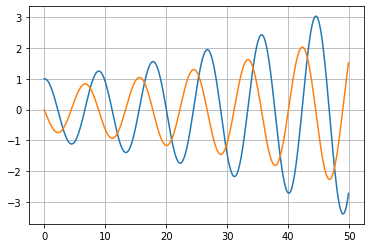

In [75]:
plt.plot(allt,allx)
plt.plot(allt,allv)
plt.grid()

We can see that the amplitude unexpectedly grows. This is a problem intrinsic to the Euler method. It can be alleviated by choosing very small dt increments, but that means a lot of computing cycles. An improvement is the Euler-Cromer method where the simple change is made that 
`dv = allx[j+1] * (-k/m) * num_dt` instead of `dv = allx[j+1] * (-k/m) * num_dt`  
(see for more details http://physics.ucsc.edu/~peter/242/leapfrog.pdf). This small change implemented:

In [76]:
allx[0] = 1 # initial conditions
allv[0] = 0

dt = 0.1

for j, thist in enumerate(allt):
    if j+1 < len(allt):
        
        dx = allv[j] * dt       
        allx[j+1] = allx[j] + dx
        
        dv = allx[j+1] * (-k1/m1) * dt                
        allv[j+1] = allv[j] + dv

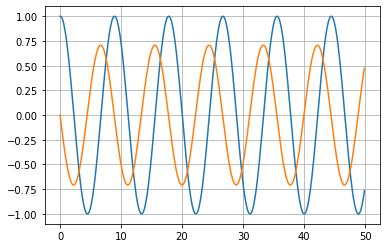

In [77]:
plt.plot(allt,allx)
plt.plot(allt,allv)
plt.grid()

This looks a lot more like what we would expect and satisfies us for now. We will use the Euler-Cromer method again for more complicated problems later. We will also move it to a dedicated function to keep the code more readable. 

## 2.2. Equations of motion from energy balance (Hamiltonian approach)

Deriving the equations of motion via force balance equations, like introduced above, is known as the Newtonian approach, centered around forces. 

An alternative approach is the Hamiltonian approach. It may be considered overkill for a simple problem like this but employing it gives us a sense of the formalism. In the Hamiltonian approach, we create an expression that keeps track of all energy in the system. In this case, that will be kinetic and potential energy:

$$H = E_{kin} + E_{pot}$$

At $x=0$ the system will have only kinetic energy and now potential energy. At the turning point, it will have only potential energy (stored in the spring) and no kinetic energy. The potential energy of the spring is $\frac{1}{2} k x^2$ so the expression becomes

$$H = \frac{1}{2} m \dot{x}^2 + \frac{1}{2} k x^2$$

which can also be written as

$$H(x,p) = \frac{p^2}{2m} + \frac{1}{2} k x^2$$

In a classical mechanics system, the time evolution of such a Hamiltonian is governed by Hamilton's coupled equations aka the evolution equation of the Hamiltonian (see https://en.wikipedia.org/wiki/Hamiltonian_system):

$$\dot{x} = \frac {d{x}}{dt} = +{\frac {\partial H}{\partial {p}}}$$
$$\dot{p} = \frac {d{p}}{dt} = -{\frac {\partial H}{\partial {x}}}$$

The derivations of the Hamiltonian lead to:

$$\dot{x} = \frac {d{x}}{dt} = \frac{p}{m}$$
$$\dot{p} = \frac {d{p}}{dt} = -kx$$

These can then also be time-evolved numerically by stepwise growing t at small increment, as discussed above (e.g. Euler's method or Runge-Kutta method). 

Using Euler's method, we get:
$$x_{j+1} = x_j + \Delta t \frac{p_j}{m}$$
$$p_{j+1} = p_j - \Delta t k{x_j}$$

In our examples, m=1, so p=v and we get the same results as above. 

## 3. Damped harmonic oscillator

Next, let's see what happens if we consider damping. In this case our equation 

$$\ddot {x} + \frac{k}{m} x = 0$$

will be added by a damping term that is proportional to the velocity

$$\ddot {x} + c \dot {x} + \frac{k}{m} x = 0$$

The equations of motion are then:

$$\ddot {x} = \dot v = \frac{dv}{dt} = - c \dot {x} - \frac{k}{m} x$$
$$\dot x = v = \frac{dx}{dt}$$

The Hamiltonian becomes:

$$H(x,p) = \frac{p^2}{2m} + \frac{1}{2}kx^2 - c p x $$

Following Hamilton's equations

$$\dot{x} = \frac {d{x}}{dt} = +{\frac {\partial H}{\partial {p}}}$$
$$\dot{p} = \frac {d{p}}{dt} = -{\frac {\partial H}{\partial {x}}}$$

we get

$$\dot{x} = \frac{p}{m} - c x$$

$$\dot{p} = - k x + c p$$

The Hamiltonian approach is having trouble with this system, since energy is not conserved and leaks out of the system without being accounted for by the Hamiltonian. This makes this approach less suited. Different people found ways to address that but it goes beyond the scope of this notebook and we'll just refer to further reading: 
* https://quantumcoffee.wordpress.com/2014/07/16/the-damped-harmonic-oscillator/
* http://www.hep.princeton.edu/~mcdonald/examples/damped.pdf
* http://astro.pas.rochester.edu/~aquillen/phy411/lecture1.pdf
* https://www.hindawi.com/journals/ijo/2010/275910/
* https://spiral.imperial.ac.uk/bitstream/10044/1/42217/6/JMPsubmissionRev.pdf
* http://core.csu.edu.cn/NR/rdonlyres/60B95A28-810C-40F2-9A35-A161AF9A44DB/0/lecnotes4.pdf
* http://www.entropy.energy/scholar/node/damped-harmonic-oscillator-energy

For now, we will see what our numerical approach gives us for this system. 

Also, based on physical experience, people "guess" a solution to this differential equation of the form. 

We'll use the same Euler-Comer numerical approach as above but instead of doing everything within a loop, we'll clean it up a bit and move the calculations into a function. This makes it me more suitable for more complicated systems.

In [78]:
c = 0.1

In [79]:
def get_next_state(present_state,dt):
        
    global m1, k1
        
    x1 = present_state[0]
    v1 = present_state[1]
        
    dx1 = v1*dt       
    nextx1 = x1 + dx1
        
    dv1 = (nextx1 * -k1/m1 + v1 * -c)*dt
    nextv1 = v1 + dv1       
    
    next_state = np.array([nextx1,nextv1])
    return next_state 

In [80]:
x1i=1 #initial displacement x1
v1i=0 #initial velocity
thisstate = np.array([x1i,v1i]) # initial state

dt = 0.1

allstates = []
for index,t in enumerate(allt): # step through every time step, at every time step evaluate the function

    allstates.append(thisstate)
    nextstate = get_next_state(thisstate, dt)  
    thisstate = nextstate    
    
df = pd.DataFrame(np.row_stack(allstates), columns = ['x1', 'v1'])
df.insert(0, "time", allt, True) 

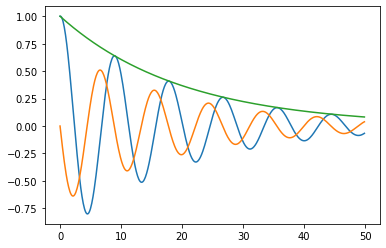

In [81]:
plt.plot(allt,df.x1)
plt.plot(allt,df.v1)
plt.plot(allt,1*np.exp(-c*0.5*allt/m1))

We also ploted a negative potential of the form of the guessed solution which shows that the guess was proper. The amplitude (and the energy) of the system decays on an exponential trajectory. 

We can also plot potential and kinetic energy and can see that the overall energy of the system also decays this way. The energy leaves the system into the environment which is not part of the model. 

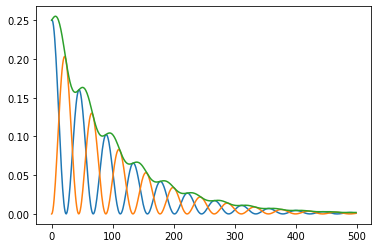

In [82]:
E_potential = 0.5*k1*df.x1**2
E_kinetic = 0.5*m1*df.v1**2
E_total = E_potential + E_kinetic

plt.plot(E_potential)
plt.plot(E_kinetic)
plt.plot(E_total)

Finally, we can see how this pans out in a corresponding animation.

In [83]:
# create position vectors for the first animated graph
data1 = []
for index,t in enumerate(allt): # step through every time step

    if index % 5 == 0: # take only every nth element
        position = df.x1[index]
        data1.append([[-4,position-1],[0,0]])

In [84]:
# call the animation function 
subplot1_data = [[np.asarray(data1)]]

thisfig = create_fig1()
add_massspring_patches(thisfig)

ani = animation.FuncAnimation(thisfig,animate1,frames=100,interval=50,fargs=(subplot1_data))
rc('animation', html='jshtml')
ani

## 4. The pendulum as a harmonic oscillator

In [85]:
Image(url= "https://upload.wikimedia.org/wikipedia/commons/thumb/6/66/Pendulum_gravity.svg/200px-Pendulum_gravity.svg.png", width=200)

A common variant of the harmonic oscillator introduced above is a pendulum. 

The force balance of the pendulum is:

$$F = -mg\sin \theta = m l \ddot\theta$$

where m cancels out and L is the length of the pendulum; the Hamiltonian is: 

$$H=\frac{p^2}{2mL^2}+mgL(1-\cos\theta)$$

We see that this looks quite different from the mass-spring system, mainly because of the trigonometric functions showing up here. To make the two systems more equivalent, often the pendulum is treated to be considered only at "small angles" i.e. near $0°$ where the sine function is almost linear as in $sin \theta \approx \theta$. 

Then the force equation becomes: 

$$\ddot\theta + \frac{g}{L} \theta = 0$$

And Hamiltonian:

$$H=\frac{p^2}{2mL^2}+\frac{1}{2}mgL\theta^2$$

What's important here is that compared to the oscillator, we have the following changes: 

$$x \rightarrow L \theta$$
$$v = \dot x \rightarrow L \dot \theta$$
$$\frac{k}{m} \rightarrow \frac{g}{L} = \omega^2$$

Because of the equivalence, we will continue to make calculations from the perspective of the mass-spring system harmonic oscillator, but will at times use the pendulum picture to illustrate results. For purposes of visualization, we will sometimes go beyond the small angle range which will however not change results qualitatively. 

Note that before we had `omega = np.sqrt(k1/m1)` where `k1=0.5` and `m1=1` which meant $\omega^2 = 0.5$. If we want to get the same frequency for the pendulum compared to the mass-spring system, then we need to get the same value here. With a realistic `g=10` for gravity on earth, this would mean `L=20` which is not convenient to animate. So we will pretend to be on another planet where our g is smaller and set `g=1` and `L=2`, so that $\omega^2 = 0.5$.

In [86]:
g = 1
L = 2

Let's quickly create some vectors for x and v that we know correspond to the harmonic oscillator. 

In [87]:
omega = np.sqrt(g/L)

allx = 1*np.sin(omega*allt)
allv = omega*np.cos(omega*allt)

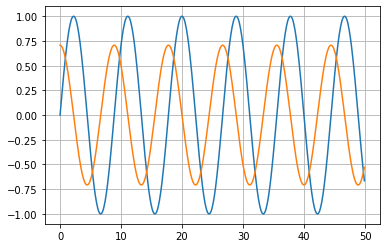

In [88]:
plt.plot(allt,allx)
plt.plot(allt,allv)
plt.grid()

In [89]:
alltheta = allx
allsin = np.sin(alltheta)*L
allcos = np.cos(alltheta)*L

In [90]:
# create position vectors for the first animated graph
data1 = []
for index,t in enumerate(allt): # step through every time step

    if index % 5 == 0: # take only every nth element    
        position = allx[index]
        data1.append([[0,0+allsin[index]],[2,2-allcos[index]]]) # first number: x anchor; second number: y anchor 

In [91]:
# call the animation function 
subplot1_data = [[np.asarray(data1)]]

thisfig = create_fig1()
add_pendulum_patches(thisfig)

ani = animation.FuncAnimation(thisfig,animate1,frames=100,interval=50,fargs=(subplot1_data))
rc('animation', html='jshtml')
ani

## 4. Coupled harmonic oscillators

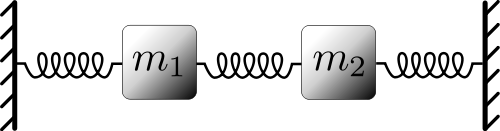

In [92]:
Image("https://upload.wikimedia.org/wikipedia/commons/thumb/3/3f/Coupled_Harmonic_Oscillator.svg/500px-Coupled_Harmonic_Oscillator.svg.png")

We will now consider coupled harmonic oscillators, as in the picture above. We will call the couplings of the left and right springs k1 and k2, and the coupling in the center kc. 

Let's again start with a consideration of forces:


$$F_1 = m \ddot x_1 = -k_1x_1 -k_c(x_1-x_2)$$

$$F_2 = m \ddot x_2 = -k_2x_2 -k_c(x_2-x_1)$$

Organizing in terms of x1 and x2 gives us:

$$\ddot x_1 = \dot v_1 = x_1 \frac{-k_1-k_c}{m_1} + x_2 \frac{k_c}{m_1}$$
$$\ddot x_2 = \dot v_2 = x_1 \frac{k_c}{m_2} + x_2 \frac{-k_2-k_c}{m_2}$$

In [93]:
k1 = 0.5
k2 = 0.5
kc = 0.1

In [94]:
t_end = 150 # time for simulations
allt = np.arange(0,t_end,0.1) # time vector size 2000

In [95]:
def get_next_state(present_state,dt):
        
    global m, ka, ks, kb
        
    x1 = present_state[0]
    v1 = present_state[1]
    x2 = present_state[2]
    v2 = present_state[3]
        
    dx1 = v1*dt       
    nextx1 = x1 + dx1
        
    dx2 = v2*dt       
    nextx2 = x2 + dx2
        
    dv1 = (nextx1 * -(k1+kc)/m1 + nextx2 * kc/m1)*dt
    nextv1 = v1 + dv1        
        
    dv2 = (nextx1 * kc/m2 + nextx2 * -(k2+kc)/m2)*dt
    nextv2 = v2 + dv2  
        
    next_state = np.array([nextx1,nextv1,nextx2,nextv2])
    return next_state 

In [96]:
x1i = 1 #initial displacement m1
v1i = 0 #initial velocity m1
x2i = 0 #initial displacement m2
v2i = 0 #initial velocity m2
thisstate = np.array([x1i,v1i,x2i,v2i]) # initial state

dt = 0.1

allstates = []
for index,t in enumerate(allt): # step through every time step

    allstates.append(thisstate)
    
    nextstate = get_next_state(thisstate, dt)  
    thisstate = nextstate    
    
df = pd.DataFrame(np.row_stack(allstates), columns = ['x1', 'v1', 'x2', 'v2']) 
df.insert(0, "time", allt, True) 

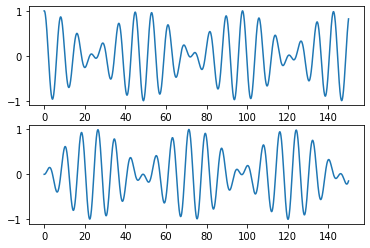

In [97]:
plt.subplot(211)
plt.plot(df.time,df.x1)
plt.subplot(212)
plt.plot(df.time,df.x2)

In [98]:
# create position vectors for the first animated graph
data1,data2,data3 = ([],[],[])
for index,t in enumerate(allt): # step through every time step

    if index % 5 == 0: # take only every nth element   
        position1 = df.x1[index]
        position2 = df.x2[index]
        data1.append([[-4,position1-2],[0,0]])
        data2.append([[4,position2+2],[0,0]])
        data3.append([[position1-2,position2+2],[0,0]]) 

In [99]:
# create vector of position function up to respective point for the second animated graph
data4,data5 = ([],[])
for index,t in enumerate(allt): # step through every time step

    if index % 5 == 0: # take only every nth element      
        position1_sofar = df.x1[:index+1]
        position2_sofar = df.x2[:index+1]
        time_sofar = allt[:index+1]
        data4.append([time_sofar,position1_sofar]) 
        data5.append([time_sofar,position2_sofar])   

In [100]:
# call the animation function 
subplot1_data = [np.asarray(data1),np.asarray(data2),np.asarray(data3)]
subplot2_data = [np.asarray(data4),np.asarray(data5)]

thisfig = create_fig2(50)
add_massspring_patches(thisfig)

ani = animation.FuncAnimation(thisfig,animate2,frames=100,interval=100,fargs=(subplot1_data,subplot2_data))
rc('animation', html='jshtml')
ani

There is an alternative way of solving the above equations which gets us deeper into the intricacies of oscillatory systems.

Because the equations of motion are linear, we can expect them to be solved by a superposition of complex exponentials of the form:

$$x_1 = A e^{iωt}$$
$$x_2 = B e^{iωt}$$ 

For a solution in this form, we know about the second derivative that 

$$\ddot x = -ω^2 x$$

This information allows us to reframe the above equations of motion into an eigenvalue problem:

$$\begin{pmatrix} \frac{(k_1+k_c)}{m} & -\frac{k_c}{m} \\ -\frac{k_c}{m} & \frac{(k_2 + k_c)}{m} \end{pmatrix} \begin{pmatrix} x_1 \\ x_2 \end{pmatrix}  = -ω^2 \begin{pmatrix} x_1 \\ x_2 \end{pmatrix} $$

which has solutions:

$$\omega^2 = \frac{k_b}{m},\frac{k_b+2k_s}{m}$$

Which corrspond to eigenvectors

$$\begin{pmatrix} x_1 \\ x_2 \end{pmatrix} = \mathinner|+\rangle =  \frac{1}{\sqrt{2}} \begin{pmatrix} 1 \\ 1 \end{pmatrix}$$

and 

$$\begin{pmatrix} x_1 \\ x_2 \end{pmatrix} = \mathinner|-\rangle = \frac{1}{\sqrt{2}} \begin{pmatrix} 1 \\ -1 \end{pmatrix}$$

In [101]:
m1 = m2 = 1

In [102]:
M = np.array([
    [(k1+kc)/m1, -kc/m1],
    [-kc/m2, (k2+kc)/m2]
])

eigvals, eigvecs = linalg.eig(M)

In [103]:
eigvals

array([0.7, 0.5])

In [104]:
eigvecs

array([[ 0.70710678,  0.70710678],
       [-0.70710678,  0.70710678]])

In [105]:
dt = 0.1

In [106]:
x1i = 1 #initial displacement m1
v1i = 0 #initial velocity m1
x2i = 1 #initial displacement m2
v2i = 0 #initial velocity m2
thisstate = np.array([x1i,v1i,x2i,v2i]) # initial state

allstates = []
for index,t in enumerate(allt): # step through every time step

    allstates.append(thisstate)
    nextstate = get_next_state(thisstate, dt)  
    thisstate = nextstate    
    
df = pd.DataFrame(np.row_stack(allstates), columns = ['x1', 'v1', 'x2', 'v2']) 
df.insert(0, "time", allt, True) 

In [107]:
# create position vectors for the first animated graph
data1,data2,data3 = ([],[],[])
for index,t in enumerate(allt): # step through every time step

    if index % 5 == 0: # take only every nth element   
        position1 = df.x1[index]
        position2 = df.x2[index]
        data1.append([[-4,position1-2],[0,0]])
        data2.append([[4,position2+2],[0,0]])
        data3.append([[position1-2,position2+2],[0,0]]) 

In [108]:
# call the animation function 
subplot1_data = [[np.asarray(data1),np.asarray(data2),np.asarray(data3)]]

thisfig = create_fig1()
add_massspring_patches(thisfig)

ani = animation.FuncAnimation(thisfig,animate1,frames=100,interval=50,fargs=(subplot1_data))
rc('animation', html='jshtml')
ani        

Finally, we will revisit the pendulum picture. 

## 5. Three coupled oscillators

In [109]:
# see http://spiff.rit.edu/classes/phys283/lectures/n_coupled/n_coupled.html

For three coupled oscillators we can go through the same motions. In this system, we assume that each oscillator has its own spring constant k1, k2, and k3 and in addition, we have two equal coupling constants k_c between the oscillators. 

Starting with the force equations:

$$F_1 = m \ddot x_1 = -k_1x_1 -k_c(x_1-x_2)$$

$$F_2 = m \ddot x_2 = -k_2x_2 -k_c(x_2-x_1) -k_c(x_2-x_3)$$

$$F_3 = m \ddot x_2 = -k_3x_3 -k_c(x_3-x_2)$$

Organizing in terms of x1 and x2 gives us:

$$\ddot x_1 = \dot v_1 = x_1 \frac{-k_1-k_c}{m_1} + x_2 \frac{k_c}{m_1}$$
$$\ddot x_2 = \dot v_2 = x_1 \frac{k_c}{m_2} + x_2 \frac{-k_2-2k_c}{m_2} + x_3 \frac{k_c}{m_2}$$
$$\ddot x_3 = \dot v_3 = x_2 \frac{k_c}{m_3} + x_3 \frac{-k_3-k_c}{m_3}$$

In [110]:
def get_next_state_3CO(present_state,dt):
        
    global m1, m2, m3, k1, k1, k3, kc
        
    x1 = present_state[0]
    v1 = present_state[1]
    x2 = present_state[2]
    v2 = present_state[3]
    x3 = present_state[4]
    v3 = present_state[5]    
        
    dx1 = v1*dt       
    nextx1 = x1 + dx1
        
    dx2 = v2*dt       
    nextx2 = x2 + dx2
        
    dx3 = v3*dt       
    nextx3 = x3 + dx3        
        
    dv1 = (nextx1 * -(k1+kc)/m1 + nextx2 * kc/m1)*dt
    nextv1 = v1 + dv1        
        
    dv2 = (nextx1 * kc/m2 + nextx2 * -(k2+2.0*kc)/m2 + nextx3 * kc/m2)*dt
    nextv2 = v2 + dv2  
        
    dv3 = (nextx2 * kc/m3 + nextx3 * -(k3+kc)/m3)*dt
    nextv3 = v3 + dv3          
        
    next_state = np.array([nextx1,nextv1,nextx2,nextv2,nextx3,nextv3])
    return next_state 

In [116]:
L1 = L2 = L3 = 1

In [117]:
m3 = 1
k3 = 1

In [118]:
kc = 0.02

In [119]:
x1i = -1 #initial displacement m1
v1i = 0 #initial velocity m1
x2i = 0 #initial displacement m2
v2i = 0 #initial velocity m2
x3i = 0 #initial displacement m3
v3i = 0 #initial velocity m3
thisstate = np.array([x1i,v1i,x2i,v2i,x3i,v3i]) # initial state

allstates = []
for index,t in enumerate(allt): # step through every time step

    allstates.append(thisstate)
    
    nextstate = get_next_state_3CO(thisstate, dt)  
    thisstate = nextstate    
    
df = pd.DataFrame(np.row_stack(allstates), columns = ['x1', 'v1', 'x2', 'v2', 'x3', 'v3']) 
df.insert(0, "time", allt, True) 

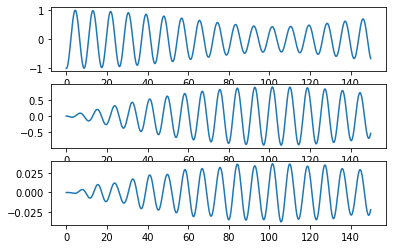

In [120]:
plt.subplot(311)
plt.plot(df.time,df.x1)
plt.subplot(312)
plt.plot(df.time,df.x2)
plt.subplot(313)
plt.plot(df.time,df.x3)

In [121]:
df = add_polar_coordinates(df)

In [122]:
# create position vectors for the first animated graph
data1,data2,data3,data4,data5 = ([],[],[],[],[])
for index,t in enumerate(allt): # step through every time step

    if index % 5 == 0: # take only every nth element    
        data1.append([[-3,-3+df.sin1[index]],[2,2-df.cos1[index]]]) # first number: x anchor; second number: y anchor 
        data2.append([[0,0+df.sin2[index]],[2,2-df.cos2[index]]]) # first number: x anchor; second number: y anchor 
        data3.append([[3,3+df.sin3[index]],[2,2-df.cos3[index]]]) # first number: x anchor; second number: y anchor 
        data4.append([[-3+df.sin1[index],0+df.sin2[index]],[2-df.cos1[index],2-df.cos2[index]]]) 
        data5.append([[0+df.sin2[index],3+df.sin3[index]],[2-df.cos2[index],2-df.cos3[index]]]) 

In [124]:
# call the animation function 
subplot1_data = [[np.asarray(data1),np.asarray(data2),np.asarray(data3),np.asarray(data4),np.asarray(data5)]]

thisfig = create_fig1()
add_pendulum_patches(thisfig)
lines1A[3].set_lw(1)
lines1A[4].set_lw(1)
lines1A[3].set_marker('')
lines1A[4].set_marker('')
lines1A[3].set_color('brown')
lines1A[4].set_color('brown')

ani = animation.FuncAnimation(thisfig,animate1,frames=100,interval=100,fargs=(subplot1_data))
rc('animation', html='jshtml')
ani        

## 6. A damped coupled system

Now let's look at a damped coupled system:

For three coupled oscillators we can go through the same motions. In this system, we assume that each oscillator has its own spring constant k1, k2, and k3 and in addition, we have two equal coupling constants k_c between the oscillators. 

Starting with the force equations:

$$F_1 = m \ddot x_1 = -k_1x_1 -k_c(x_1-x_2) - c \dot {x_1}$$

$$F_2 = m \ddot x_2 = -k_2x_2 -k_c(x_2-x_1) -k_c(x_2-x_3) - c \dot {x_2}$$

$$F_3 = m \ddot x_2 = -k_3x_3 -k_c(x_3-x_2) - c \dot {x_3}$$

$$\ddot {x} + c \dot {x} + \frac{k}{m} x = 0$$

Organizing in terms of x1 and x2 gives us:

$$\ddot x_1 = \dot v_1 = x_1 \frac{-k_1-k_c}{m_1} + x_2 \frac{k_c}{m_1} - c v_1$$
$$\ddot x_2 = \dot v_2 = x_1 \frac{k_c}{m_2} + x_2 \frac{-k_2-2k_c}{m_2} + x_3 \frac{k_c}{m_2} - c v_2$$
$$\ddot x_3 = \dot v_3 = x_2 \frac{k_c}{m_3} + x_3 \frac{-k_3-k_c}{m_3} - c v_3$$

In [125]:
c

0.1

In [126]:
def get_next_state_3CD(present_state,dt):
        
    global m1, m2, m3, k1, k1, k3, kc
        
    x1 = present_state[0]
    v1 = present_state[1]
    x2 = present_state[2]
    v2 = present_state[3]
    x3 = present_state[4]
    v3 = present_state[5]    
        
    dx1 = v1*dt       
    nextx1 = x1 + dx1
        
    dx2 = v2*dt       
    nextx2 = x2 + dx2
        
    dx3 = v3*dt       
    nextx3 = x3 + dx3        
        
    dv1 = (nextx1 * -(k1+kc)/m1 + nextx2 * kc/m1 - v1*c)*dt
    nextv1 = v1 + dv1        
        
    dv2 = (nextx1 * kc/m2 + nextx2 * -(k2+2.0*kc)/m2 + nextx3 * kc/m2 - v2*c)*dt
    nextv2 = v2 + dv2  
        
    dv3 = (nextx2 * kc/m3 + nextx3 * -(k3+kc)/m3 - v3*c)*dt
    nextv3 = v3 + dv3          
        
    next_state = np.array([nextx1,nextv1,nextx2,nextv2,nextx3,nextv3])
    return next_state 

In [127]:
c = 0.02
kc = 0.02

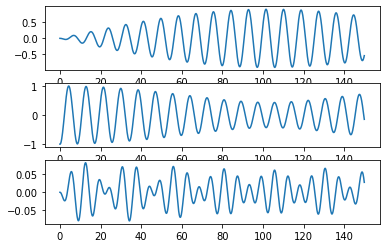

In [128]:
x1i = 0 #initial displacement m1
v1i = 0 #initial velocity m1
x2i = -1 #initial displacement m2
v2i = 0 #initial velocity m2
x3i = 0 #initial displacement m3
v3i = 0 #initial velocity m3
thisstate = np.array([x1i,v1i,x2i,v2i,x3i,v3i]) # initial state

allstates = []
for index,t in enumerate(allt): # step through every time step

    allstates.append(thisstate)
    
    nextstate = get_next_state_3CO(thisstate, dt)  
    thisstate = nextstate    
    
df = pd.DataFrame(np.row_stack(allstates), columns = ['x1', 'v1', 'x2', 'v2', 'x3', 'v3']) 
df.insert(0, "time", allt, True) 

plt.subplot(311)
plt.plot(df.time,df.x1)
plt.subplot(312)
plt.plot(df.time,df.x2)
plt.subplot(313)
plt.plot(df.time,df.x3)

In [129]:
# how to know when one is on resonance with three pendula? 

In [130]:
df = add_polar_coordinates(df)

# create position vectors for the first animated graph
data1,data2,data3,data4,data5 = ([],[],[],[],[])
for index,t in enumerate(allt): # step through every time step

    if index % 5 == 0: # take only every nth element    
        data1.append([[-3,-3+df.sin1[index]],[2,2-df.cos1[index]]]) # first number: x anchor; second number: y anchor 
        data2.append([[0,0+df.sin2[index]],[2,2-df.cos2[index]]]) # first number: x anchor; second number: y anchor 
        data3.append([[3,3+df.sin3[index]],[2,2-df.cos3[index]]]) # first number: x anchor; second number: y anchor 
        data4.append([[-3+df.sin1[index],0+df.sin2[index]],[2-df.cos1[index],2-df.cos2[index]]]) 
        data5.append([[0+df.sin2[index],3+df.sin3[index]],[2-df.cos2[index],2-df.cos3[index]]]) 

In [131]:
# call the animation function 
subplot1_data = [[np.asarray(data1),np.asarray(data2),np.asarray(data3),np.asarray(data4),np.asarray(data5)]]

thisfig = create_fig1()
add_pendulum_patches(thisfig)
lines1A[3].set_lw(1)
lines1A[4].set_lw(1)
lines1A[3].set_marker('')
lines1A[4].set_marker('')
lines1A[3].set_color('brown')
lines1A[4].set_color('brown')

ani = animation.FuncAnimation(thisfig,animate1,frames=100,interval=100,fargs=(subplot1_data))
rc('animation', html='jshtml')
ani        

To understand where resonances occur, we need to find the modes and eigen frequencies of the system.

$$\begin{pmatrix} \frac{-(k_1+k_c)}{m_1} & \frac{k_c}{m_1} & 0 \\ \frac{k_c}{m_2} & \frac{-(k_2 + 2k_c)}{m_2} & \frac{k_c}{m_2} \\ 0 & \frac{k_c}{m_3} & \frac{-(k_3+k_c)}{m_3} \end{pmatrix} \begin{pmatrix} x_1 \\ x_2 \\ x_3 \end{pmatrix}  = -ω^2 \begin{pmatrix} x_1 \\ x_2 \\ x_3 \end{pmatrix} $$

In [132]:
M = np.array([
    [-(k1+kc)/m1, kc/m1, 0],
    [kc/m2, -(k2+2*kc)/m2, kc/m2],
    [0, kc/m3, -(k3+kc)/m3]
])

M = M*-1

eigvals, eigvecs = linalg.eig(M)

In [133]:
eigvals

array([0.50742089, 0.55174584, 1.02083327])

In [134]:
eigvecs

array([[-0.8463074 ,  0.53269224,  0.00166233],
       [-0.5322898 , -0.84553812, -0.04162749],
       [-0.02076908, -0.03611449,  0.99913182]])

## Appendix A: Another note on vibrations, atoms and nuclei

In [135]:
from IPython.display import HTML

# Youtube
#HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/S_f2qV2_U00?rel=0&amp;controls=0&amp;showinfo=0" frameborder="0" allowfullscreen></iframe>')
HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/pCWbb4c2SEo?rel=0&showinfo=0" frameborder="0" allow="accelerometer; autoplay; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>')


C:\Users\Florian\Anaconda3\lib\site-packages\IPython\core\display.py:694: UserWarning: Consider using IPython.display.IFrame instead
  warnings.warn("Consider using IPython.display.IFrame instead")


## Appendix B: Comparison of numerical time evolution algorithms

Finally a comparison between Euler-Cohen and Runge-Kutta 4:

In [136]:
def derivs_2m(s):
    x1=s[0]
    v1=s[1]
    x2=s[2]
    v2=s[3]
    a1 = (-(k1+kc)*x1 + kc*x2)/m1
    a2 = (-(k2+kc)*x2 + kc*x1)/m2
    return np.array([v1, a1, v2, a2])
    
def get_next_stateRK4(present_state, dt):
    """
    Take a single RK4 step.
    """
    f1 = derivs_2m(present_state)
    f2 = derivs_2m(present_state+f1*dt/2.0)
    f3 = derivs_2m(present_state+f2*dt/2.0)
    f4 = derivs_2m(present_state+f3*dt)
    return present_state + (f1+2*f2+2*f3+f4)*dt/6.0

In [137]:
x1i = 1 #initial displacement m1
v1i = 0 #initial velocity m1
x2i = 0 #initial displacement m2
v2i = 0 #initial velocity m2
thisstate = np.array([x1i,v1i,x2i,v2i]) # initial state

dt = 0.1

allstates = []
for index,t in enumerate(allt): # step through every time step

    allstates.append(thisstate)
    
    nextstate = get_next_state(thisstate, dt)  
    thisstate = nextstate    
    
df1 = pd.DataFrame(np.row_stack(allstates), columns = ['x1', 'v1', 'x2', 'v2']) 
df1.insert(0, "time", allt, True) 

In [138]:
x1i = 1 #initial displacement m1
v1i = 0 #initial velocity m1
x2i = 0 #initial displacement m2
v2i = 0 #initial velocity m2
thisstate = np.array([x1i,v1i,x2i,v2i]) # initial state

dt = 0.1

allstates = []
for index,t in enumerate(allt): # step through every time step

    allstates.append(thisstate)
    
    nextstate = get_next_stateRK4(thisstate, dt)  
    thisstate = nextstate    
    
df2 = pd.DataFrame(np.row_stack(allstates), columns = ['x1', 'v1', 'x2', 'v2']) 
df2.insert(0, "time", allt, True) 

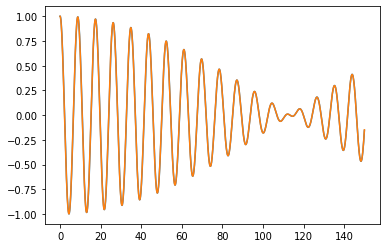

In [139]:
plt.plot(df1.time,df1.x1)
plt.plot(df2.time,df2.x1)

## Appendix C: Does excitation transfer happen even if the coupling is very weak?

In [140]:
t_end = 4000 # time for simulations
allt = np.arange(0,t_end,0.1) # time vector size 2000
dt = 0.1

In [141]:
kc = 0.001

x1i = 1 #initial displacement m1
v1i = 0 #initial velocity m1
x2i = 0 #initial displacement m2
v2i = 0 #initial velocity m2
thisstate = np.array([x1i,v1i,x2i,v2i]) # initial state

allstates = []
for index,t in enumerate(allt): # step through every time step

    allstates.append(thisstate)
    
    nextstate = get_next_stateRK4(thisstate, dt)  
    thisstate = nextstate    
    
df2 = pd.DataFrame(np.row_stack(allstates), columns = ['x1', 'v1', 'x2', 'v2']) 
df2.insert(0, "time", allt, True) 

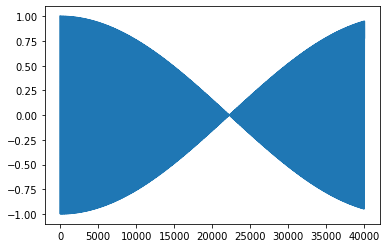

In [142]:
plt.plot(df2.x1)

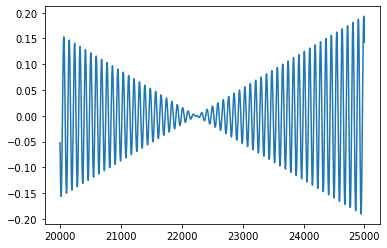

In [143]:
plt.plot(df2.x1[20000:25000])